# ENERGY PRODUCTION


# Business Objective:
A combined-cycle power plant comprises gas turbines, steam turbines, and heat recovery steam generators. In this type of plant, the electricity is generated by gas and steam turbines combined in one cycle. Then, it is transferred from one turbine to another. We have to model the energy generated as a function of exhaust vacuum and ambient variables and use that model to improve the plant's performance.

Data Set Details: 
This is a project where the variable to be predicted is energy production The data file contains 9568 observations with five variables collected from a combined cycle power plant over six years when the power plant was set to work with a full load.
    
    
The variables, or features, are the following:
temperature, in degrees Celsius.
exhaust_vacuum, in cm Hg.
amb_pressure, in millibar. (Ambient pressure)
r_humidity, in percentage. (Relative humidity)
energy_production, in MW, net hourly electrical energy output.

Acceptance Criterion: Need to deploy the end results using Flask /Streamlit etc

In [1]:
#load the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('energy_production.csv')

In [3]:
df.head

<bound method NDFrame.head of       temperature  exhaust_vacuum  amb_pressure  r_humidity  energy_production
0            9.59           38.56       1017.01       60.10             481.30
1           12.04           42.34       1019.72       94.67             465.36
2           13.87           45.08       1024.42       81.69             465.48
3           13.72           54.30       1017.89       79.08             467.05
4           15.14           49.64       1023.78       75.00             463.58
...           ...             ...           ...         ...                ...
9563        17.10           49.69       1005.53       81.82             457.32
9564        24.73           65.34       1015.42       52.80             446.92
9565        30.44           56.24       1005.19       56.24             429.34
9566        23.00           66.05       1020.61       80.29             421.57
9567        17.75           49.25       1020.86       63.67             454.41

[9568 rows x 5 column

In [4]:
df.columns

Index(['temperature', 'exhaust_vacuum', 'amb_pressure', 'r_humidity',
       'energy_production'],
      dtype='object')

In [5]:
df.shape

(9568, 5)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9568 entries, 0 to 9567
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        9568 non-null   float64
 1   exhaust_vacuum     9568 non-null   float64
 2   amb_pressure       9568 non-null   float64
 3   r_humidity         9568 non-null   float64
 4   energy_production  9568 non-null   float64
dtypes: float64(5)
memory usage: 373.9 KB


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
temperature,9568.0,19.651231,7.452473,1.81,13.5100,20.345,25.72,37.11
exhaust_vacuum,9568.0,54.305804,12.707893,25.36,41.7400,52.080,66.54,81.56
amb_pressure,9568.0,1013.259078,5.938784,992.89,1009.1000,1012.940,1017.26,1033.30
r_humidity,9568.0,73.308978,14.600269,25.56,63.3275,74.975,84.83,100.16
energy_production,9568.0,454.365009,17.066995,420.26,439.7500,451.550,468.43,495.76


In [8]:
df.isna().sum()  #No missing values 

temperature          0
exhaust_vacuum       0
amb_pressure         0
r_humidity           0
energy_production    0
dtype: int64

In [9]:
df[df.duplicated()].count()

temperature          41
exhaust_vacuum       41
amb_pressure         41
r_humidity           41
energy_production    41
dtype: int64

# Boxplot
Outlier Detection

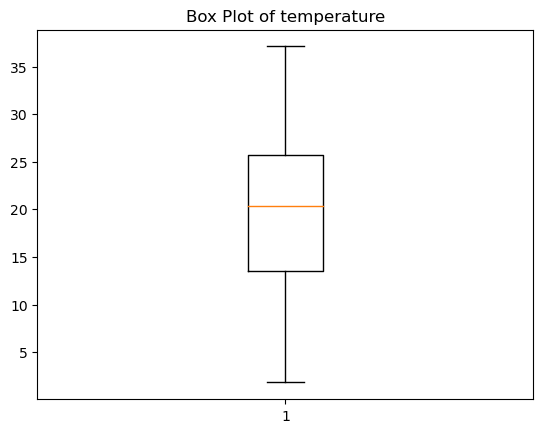

In [10]:
#Boxplot
#help(plt.boxplot)
plt.boxplot(df['temperature'],vert = True) 
plt.title('Box Plot of temperature')
plt.show()

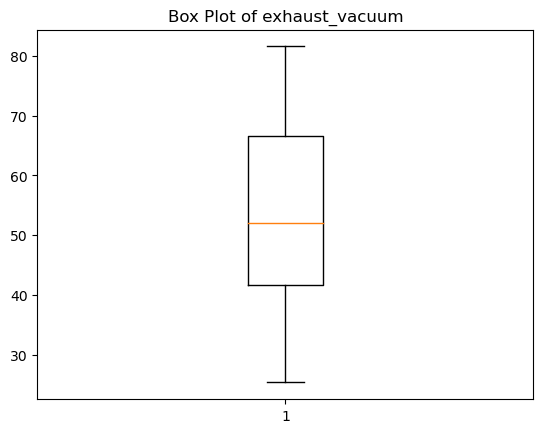

In [11]:
#Boxplot
#help(plt.boxplot)
plt.boxplot(df['exhaust_vacuum'],vert = True)
plt.title('Box Plot of exhaust_vacuum')
plt.show()

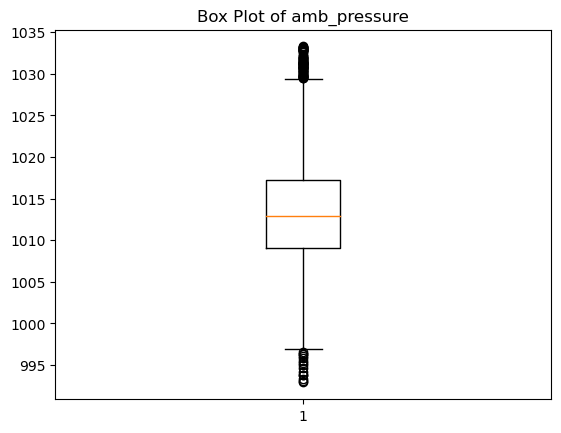

In [12]:
#Boxplot
#help(plt.boxplot)
plt.boxplot(df['amb_pressure'],vert = True)
plt.title('Box Plot of amb_pressure')
plt.show()

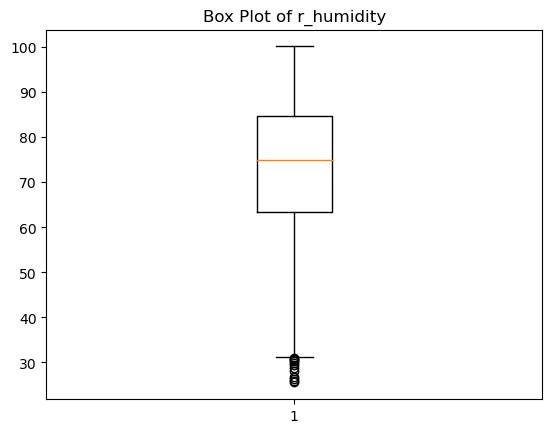

In [13]:
#Boxplot
#help(plt.boxplot)
plt.boxplot(df['r_humidity'],vert = True)
plt.title('Box Plot of r_humidity')
plt.show()

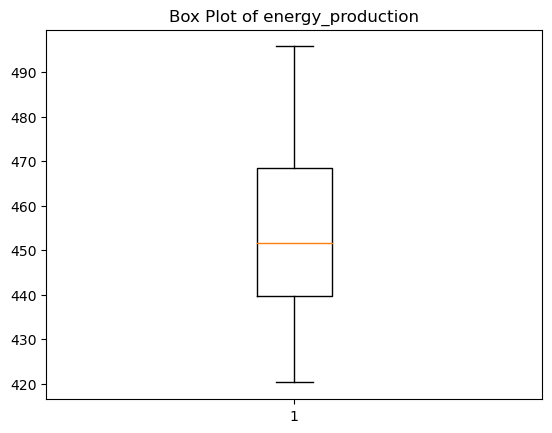

In [14]:
#Boxplot
#help(plt.boxplot)
plt.boxplot(df['energy_production'],vert = True)
plt.title('Box Plot of energy_production')
plt.show()

# Histogram

<AxesSubplot:>

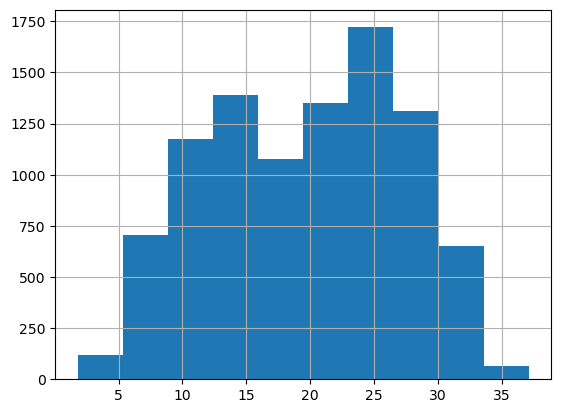

In [15]:
df['temperature'].hist()

<AxesSubplot:>

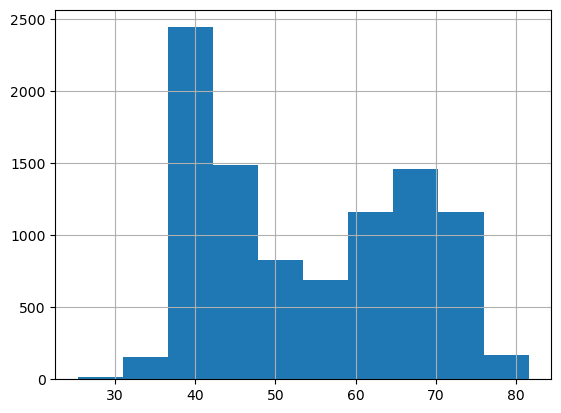

In [16]:
df['exhaust_vacuum'].hist()

<AxesSubplot:>

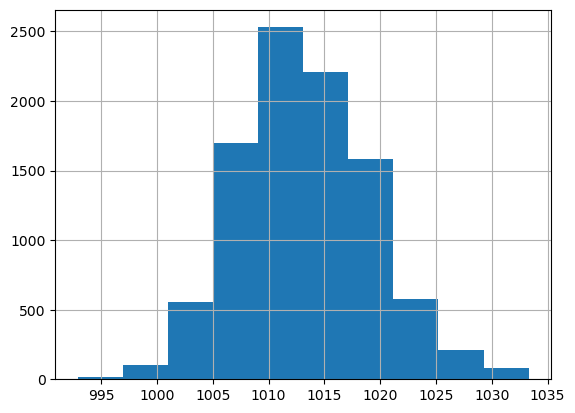

In [17]:
df['amb_pressure'].hist()

<AxesSubplot:>

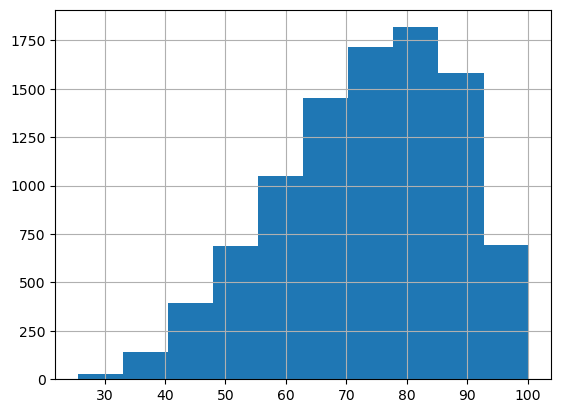

In [18]:
df['r_humidity'].hist()

<AxesSubplot:>

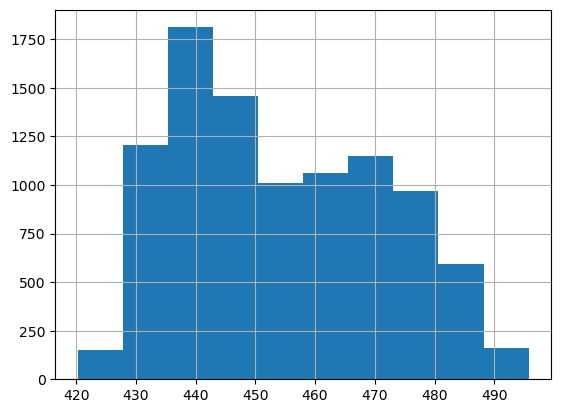

In [19]:
df['energy_production'].hist()

# Scatterplot 
(Finding the relations)

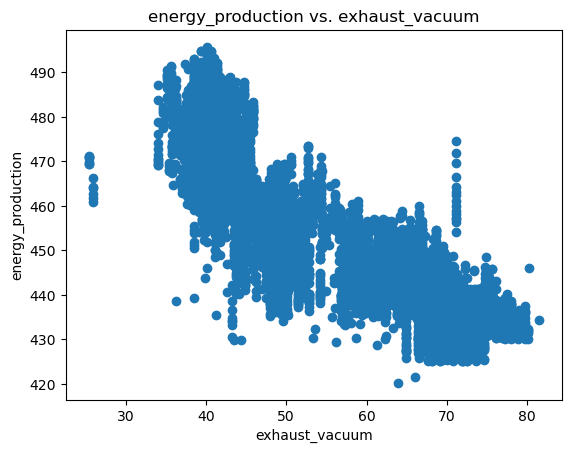

In [20]:
# Scatter plot of Energy_Generated against Exhaust_Vacuum
plt.scatter(df['exhaust_vacuum'], df['energy_production'])
plt.xlabel('exhaust_vacuum')
plt.ylabel('energy_production')
plt.title('energy_production vs. exhaust_vacuum')
plt.show()


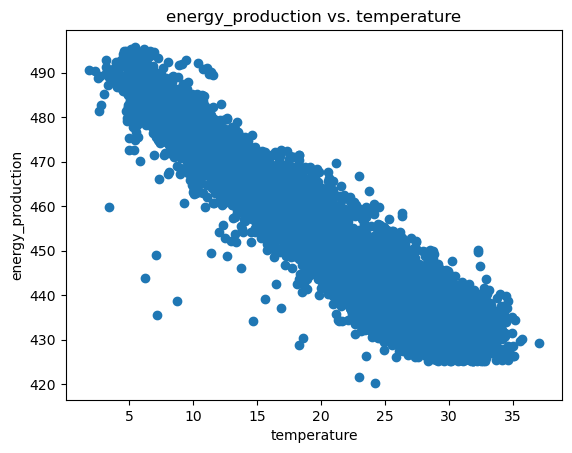

In [21]:
# Scatter plot of Energy_Generated against Temperature
plt.scatter(df['temperature'], df['energy_production'])
plt.xlabel('temperature')
plt.ylabel('energy_production')
plt.title('energy_production vs. temperature')
plt.show()


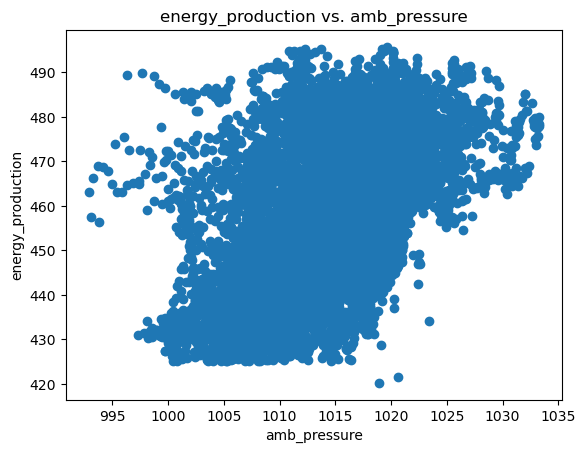

In [22]:
# Scatter plot of Energy_Generated against amb_pressure
plt.scatter(df['amb_pressure'], df['energy_production'])
plt.xlabel('amb_pressure')
plt.ylabel('energy_production')
plt.title('energy_production vs. amb_pressure')
plt.show()

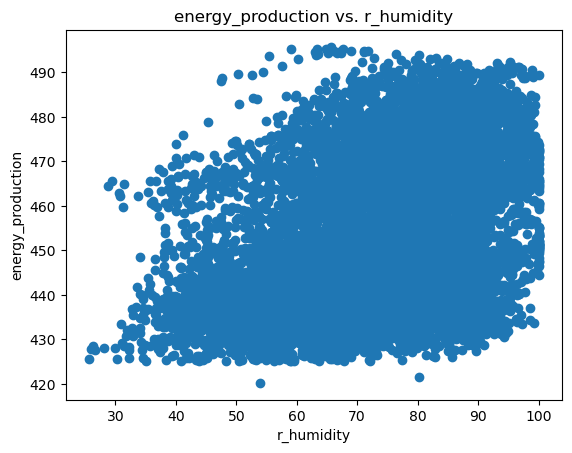

In [23]:
# Scatter plot of Energy_Generated against r_humidity
plt.scatter(df['r_humidity'], df['energy_production'])
plt.xlabel('r_humidity')
plt.ylabel('energy_production')
plt.title('energy_production vs. r_humidity')
plt.show()

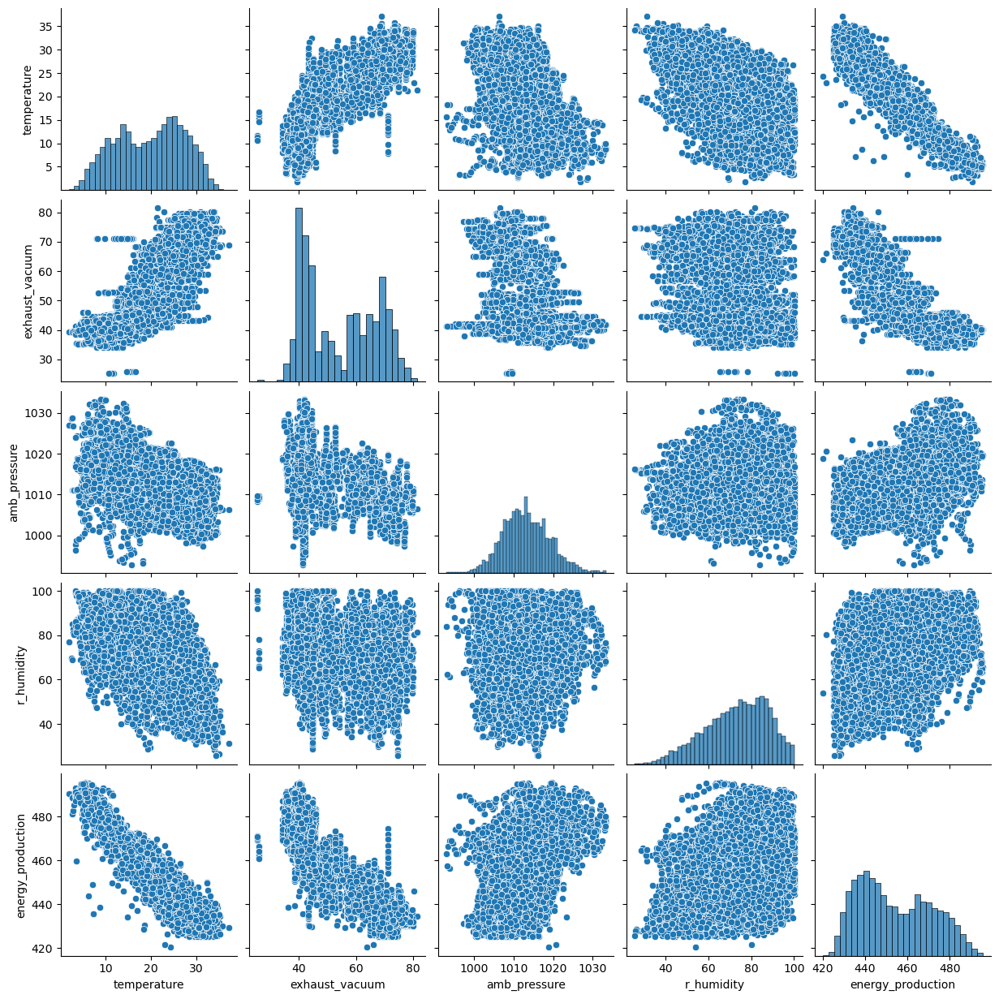

In [24]:
sns.pairplot(df)

From the above visualization, we can infer that-->

1.There is a Highly Positive Correlationship between exhaust_vacuum and temparature

2.There is a Highly negative corelationship between temperature and energy_production

3.There is a negative corelationship between exhaust_vacuum and energy_production

4.There is a Positive Correlationship between amb_pressure and energy_production

# correlation

In [25]:

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Print the correlation matrix
print(correlation_matrix)


                   temperature  exhaust_vacuum  amb_pressure  r_humidity  \
temperature           1.000000        0.844107     -0.507549   -0.542535   
exhaust_vacuum        0.844107        1.000000     -0.413502   -0.312187   
amb_pressure         -0.507549       -0.413502      1.000000    0.099574   
r_humidity           -0.542535       -0.312187      0.099574    1.000000   
energy_production    -0.948128       -0.869780      0.518429    0.389794   

                   energy_production  
temperature                -0.948128  
exhaust_vacuum             -0.869780  
amb_pressure                0.518429  
r_humidity                  0.389794  
energy_production           1.000000  


Inference: As we can see "temperature" & "exhaust_vaccum" have a strong positve Correlation, So can say there is a multicollinearity effect present

sns.heatmap(df3.corr())

# heatmap

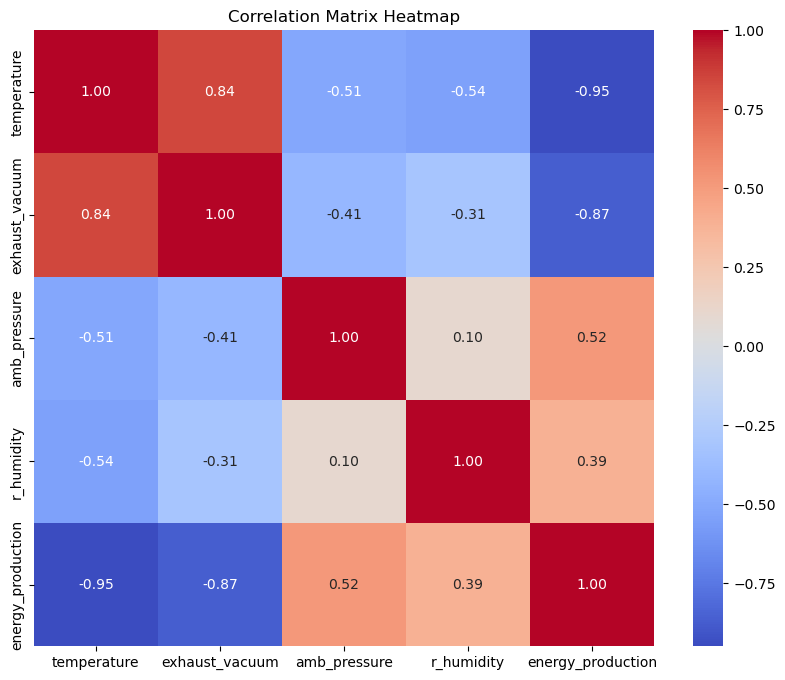

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()


Here temperature and exhaust_vaccum is in thick colour we can say that correlation is hight 


# Treating Outlayers

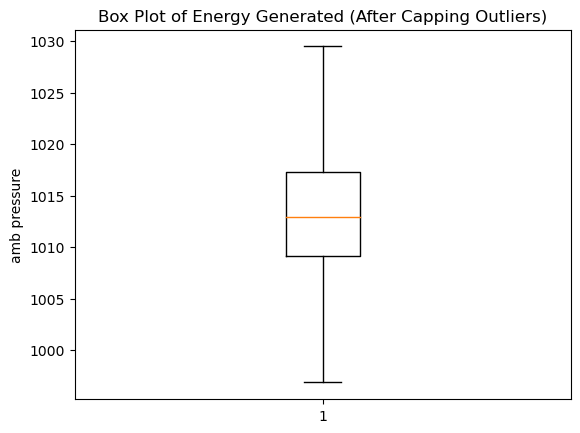

In [27]:
#Capping the Outlayers for the amb_pressure
# Calculate the Interquartile Range (IQR) to identify outliers

Q1 = df['amb_pressure'].quantile(0.25)
Q3 = df['amb_pressure'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for capping outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Cap the outliers to the upper and lower bounds
df['amb_pressure'] = df['amb_pressure'].apply(lambda x: upper_bound if x > upper_bound else (lower_bound if x < lower_bound else x))

# Create a new box plot after capping the outliers
plt.boxplot(df['amb_pressure'])
plt.ylabel('amb pressure')
plt.title('Box Plot of Energy Generated (After Capping Outliers)')
plt.show()

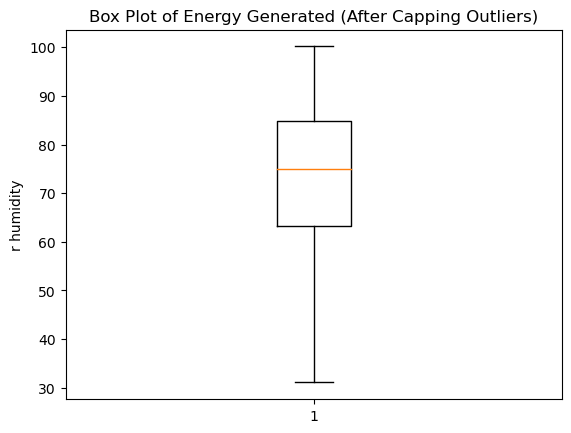

In [28]:
#Capping the Outlayers for the r_humidity
# Calculate the Interquartile Range (IQR) to identify outliers

Q1 = df['r_humidity'].quantile(0.25)
Q3 = df['r_humidity'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for capping outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Cap the outliers to the upper and lower bounds
df['r_humidity'] = df['r_humidity'].apply(lambda x: upper_bound if x > upper_bound else (lower_bound if x < lower_bound else x))

# Create a new box plot after capping the outliers
plt.boxplot(df['r_humidity'])
plt.ylabel('r humidity')
plt.title('Box Plot of Energy Generated (After Capping Outliers)')
plt.show()

In [29]:
import statsmodels.formula.api as smf

VIF(Variable inflation Factor) -- Using this method to confirm Collinearity if it is still there or not.

Checking all Y(input) Variable one by one regressing them with Eachother

Industry Standard ≤ 20 for VIF Value

In [30]:
rsq_Tem = smf.ols('temperature~exhaust_vacuum+amb_pressure+r_humidity',data=df).fit().rsquared
vif_Tem = 1/(1-rsq_Tem)

rsq_ex = smf.ols('exhaust_vacuum~temperature+amb_pressure+r_humidity',data=df).fit().rsquared
vif_ex = 1/(1-rsq_ex)

rsq_amb = smf.ols('amb_pressure~temperature+exhaust_vacuum+r_humidity',data=df).fit().rsquared
vif_amb = 1/(1-rsq_amb)

rsq_rh = smf.ols('r_humidity~temperature+exhaust_vacuum+amb_pressure',data=df).fit().rsquared
vif_rh = 1/(1-rsq_rh)

# Storing vif values in a data frame
d1 = {'Variables':['temperature','exhaust_vacuum','amb_pressure','r_humidity'],'VIF':[vif_Tem,vif_ex,vif_amb,vif_rh]}
Vif_frame = pd.DataFrame(d1)
Vif_frame

,Variables,VIF
0,temperature,5.979982
1,exhaust_vacuum,3.942533
2,amb_pressure,1.455528
3,r_humidity,1.704958


Inference: There are no collinearity between variables Since All columns VIF is less then 20. So Now We will Start the Model Building

# Auto EDA

In [31]:
!pip install autoviz 

In [32]:
import pandas as pd
import seaborn as sns
df = pd.read_csv('energy_production.csv')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
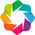

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [33]:
from autoviz.AutoViz_Class import AutoViz_Class

In [34]:
AV = AutoViz_Class()

In [35]:
import matplotlib.pyplot as plt
filename = 'energy_production.csv'
sep = ","
dft = AV.AutoViz(
    filename
)

        

Shape of your Data Set loaded: (9568, 5)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    5 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 41 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
temperature,float64,0.000000,NA,1.810000,37.110000,No issue
exhaust_vacuum,float64,0.000000,NA,25.360000,81.560000,has a high correlation with ['temperature']. Consider dropping one of them.
amb_pressure,float64,0.000000,NA,992.890000,1033.300000,has 91 outliers greater than upper bound (1029.37) or lower than lower bound(996.91). Cap them or remove them.
r_humidity,float64,0.000000,NA,25.560000,100.160000,has 13 outliers greater than upper bound (117.06) or lower than lower bound(31.16). Cap them or remove them.
energy_production,float64,0.000000,NA,420.260000,495.760000,"has a high correlation with ['temperature', 'exhaust_vacuum']. Consider dropping one of them."


Number of All Scatter Plots = 15
All Plots done
Time to run AutoViz = 2 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


# Model Building

In [36]:
dft.shape

(9568, 5)

In [37]:
X = dft.iloc[:,0:4]
Y = dft.iloc[:,4]

In [38]:
from sklearn.model_selection import train_test_split

In [39]:
# Train & Test Split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.2,random_state=10)

In [40]:
X_train

,temperature,exhaust_vacuum,amb_pressure,r_humidity
6629,27.31,68.14,1005.73,50.74
3000,5.18,40.27,1010.84,81.64
624,25.10,69.89,1015.42,85.81
9140,18.15,58.46,1017.42,88.24
4429,27.88,63.87,1017.79,40.00
...,...,...,...,...
9372,4.96,40.07,1011.80,67.38
7291,20.76,44.58,1017.09,57.47
1344,22.12,49.39,1019.80,72.83
7293,24.20,64.33,1011.15,84.23


In [41]:
Y_train

6629    437.83
3000    489.10
624     434.98
9140    449.48
4429    443.24
         ...  
9372    494.75
7291    462.01
1344    451.00
7293    442.78
1289    486.09
Name: energy_production, Length: 7654, dtype: float64

# Linear Regression 

In [42]:
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.linear_model import LinearRegression

In [43]:
Lmodel = LinearRegression()
Lmodel.fit(X_train,Y_train)
Lmodel.score(X_test,Y_test)*100

91.98969303303214

# Random Forest Regression

In [44]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
# Fit the model to the training data
rf_model.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred = rf_model.predict(X_test)

# Calculate the R-squared score (coefficient of determination)
r2_score = r2_score(Y_test, Y_pred)

# Print the R-squared score

print("Random Forest Regression :", r2_score)


Random Forest Regression : 0.9562000823331397


# Decision Tree Regression

In [45]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

In [46]:


from sklearn.metrics import r2_score
dt_model = DecisionTreeRegressor(max_depth=None)
# Fit the model to the training data
dt_model.fit(X_train, Y_train)

# Make predictions on the test data
dt_pred = dt_model.predict(X_test)

# Calculate the R-squared score (coefficient of determination)
dt_score = r2_score(Y_test, dt_pred)

# Print the R-squared score

print("Decision Tree Regression:", dt_score)



Decision Tree Regression: 0.9267404748078859


# XGBoost Regression

In [47]:
import xgboost as xgb
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Create and train the XGBoost Regression model
xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42)  # You can adjust n_estimators and other parameters
xgb_model.fit(X_train, Y_train)
# Make predictions on the test set
xgb_predictions = xgb_model.predict(X_test)
# Calculate and print the R-squared score
xgb_score = r2_score(Y_test, xgb_predictions)
print("XGBoost Regression:", xgb_score)

XGBoost Regression: 0.9658802370937001


# Support vector machine Regression

In [48]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Feature scaling (important for SVM)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Create and train the SVM Regression model
svm_model = SVR(kernel='linear')  # You can choose other kernels like 'rbf' or 'poly'
svm_model.fit(X_train_scaled, Y_train)
# Make predictions on the test set
svm_predictions = svm_model.predict(X_test_scaled)
# Calculate and print the R-squared score
svm_score = r2_score(Y_test, svm_predictions)
print("SVM Regression:", svm_score)

SVM Regression: 0.9307110733943138


# K-nearest Neighbours Regression

In [49]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Feature scaling (important for KNN)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Create and train the KNN Regression model
knn_model = KNeighborsRegressor(n_neighbors=5)  # You can adjust the number of neighbors
knn_model.fit(X_train_scaled, Y_train)
# Make predictions on the test set
knn_predictions = knn_model.predict(X_test_scaled)
# Calculate and print the R-squared score
knn_score = r2_score(Y_test, knn_predictions)
print("KNN Regression:", knn_score)

KNN Regression: 0.9507179945389804


# Ridge Regression

In [50]:
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score

# Create and train the Ridge Regression model
ridge_model = Ridge(alpha=1.0)  # You can adjust the alpha parameter
ridge_model.fit(X_train, Y_train)
# Calculate and print the R-squared score on the test set
ridge_score = ridge_model.score(X_test, Y_test)
print("Ridge Regression:", ridge_score)

Ridge Regression: 0.9308208213155603


# Losso Regression

In [51]:
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score

# Create and train the Lasso Regression model
lasso_model = Lasso(alpha=1.0)  # You can adjust the alpha parameter
lasso_model.fit(X_train, Y_train)
# Calculate and print the R-squared score on the test set
lasso_score = lasso_model.score(X_test, Y_test)
print("Lasso Regression:", lasso_score)

Lasso Regression: 0.9301291276348322


In [52]:
# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create models
models = [
    ("Linear Regression",        LinearRegression()),
    ("Ridge Regression",         Ridge()),
    ("Lasso Regression",         Lasso()),
    ("Decision Tree Regression", DecisionTreeRegressor()),
    ("Random Forest Regression", RandomForestRegressor(n_estimators=100, random_state=42)),
    ("XGBoost Regression",       xgb.XGBRegressor(n_estimators=100, random_state=42)),
    ("SVM Regression",           SVR(kernel='linear')),
    ("KNN Regression",           KNeighborsRegressor(n_neighbors=5))
]

# Train and evaluate models
for name, model in models:
    model.fit(X_train_scaled, Y_train)
    predictions = model.predict(X_test_scaled)
    r2 = r2_score(Y_test, predictions)
    print(f"{name}: {r2}")

Linear Regression: 0.9308209429828996
Ridge Regression: 0.9308149307606073
Lasso Regression: 0.9131287833462741
Decision Tree Regression: 0.9403224275121
Random Forest Regression: 0.9631980048111048
XGBoost Regression: 0.9659031311841699
SVM Regression: 0.9307110733943138
KNN Regression: 0.9507179945389804


# As a result,we are considering XGBoost Regression 

In [53]:
import pickle

In [55]:
# Save an object to a file using pickle
data = [1, 2, 3, 4, 5]
with open('Lmodel.pkl', 'wb') as file:
    pickle.dump(Lmodel.fit, file)

# Load the object from the file
with open('Lmodel.pkl', 'rb') as file:
    loaded_data = pickle.load(file)

print(loaded_data)  # Output: [1, 2, 3, 4, 5]

<bound method LinearRegression.fit of LinearRegression()>


In [56]:
pip install pandas streamlit joblib


In [58]:
import pandas as pd
from pickle import load
import streamlit as st
import joblib

# Load the trained model
model = joblib.load(r"C:\Users\konga_21xqbnk\OneDrive\Desktop\project2\Lmodel.pkl")


import os

script_directory = os.path.dirname(os.path.abspath(__file__))
model_path = os.path.join(script_directory, 'Lmodel.pkl')
model = joblib.load(model_path)


# Create the Streamlit UI
st.title('Energy Production Prediction in a Combined Cycle Power Plant')

def main():

    # Add four input boxes for user input
    
    temperature = st.number_input("Temperature", min_value=1, max_value=40,)
    st.markdown("<p style='font-size: 12px;'> Note: Temperature ranges between 1 to 35 in degree celcius </p>", unsafe_allow_html=True)
    exhaust_vacuum = st.number_input("Exhaust Vaccum", min_value=25, max_value=80)
    st.markdown("<p style='font-size: 12px;'> Note: Exhaust Vaccum ranges between 25 to 80 in cm Hg </p>", unsafe_allow_html=True)
    amb_pressure = st.number_input("Ambient Pressure", min_value=990, max_value=1033)
    st.markdown("<p style='font-size: 12px;'> Note: Ambient Pressure ranges between 990 to 1030 in milibar </p>", unsafe_allow_html=True)
    r_humidity = st.number_input("Relative Humidity", min_value=25, max_value=100)
    st.markdown("<p style='font-size: 12px;'> Note: Relative Humidity ranges between 25 to 100 in Percentage </p>", unsafe_allow_html=True)

    # Assuming you have a DataFrame 'df' with appropriate columns
    
    user_input = pd.DataFrame({
        'temperature': [float(temperature)],
        'exhaust_vacuum': [float(exhaust_vacuum)],
        'amb_pressure': [float(amb_pressure)],
        'r_humidity': [float(r_humidity)]
    })
    
    
    # Perform prediction using the loaded model
    prediction = model.predict(user_input)

    # Display the prediction result
    # st.write("Predicted Power Generation:", prediction)
    
    if st.button('Predict'): 
        st.write(prediction)

if __name__ == "__main__":
    main()


# Make predictions using the model
# prediction = model.predict([[exhaust_vacuum, ambient_temperature, relative_humidity, atmospheric_pressure]])

# Display the prediction
#st.write(f'Predicted Energy Production: {prediction[0]:.2f} MW')

# About Section
st.sidebar.title('About This App')
st.sidebar.text('Welcome to the Energy Production Prediction app for\na Combined Cycle Power Plant!')
st.sidebar.text('This app allows you to estimate the energy production of a\ncombined cycle power plant based on input parameters such as\nexhaust vacuum, ambient temperature, relative humidity,\nand atmospheric pressure.')
st.sidebar.text('Please adjust the input parameters in the sidebar to see the\npredicted energy production.')

st.sidebar.title('Input Parameters')
st.sidebar.text('In the sidebar on the left, you can find sliders for each\ninput parameter. Move the sliders to set the values for\nexhaust vacuum, ambient temperature, relative humidity, and\natmospheric pressure. The app will then use these values\nto predict the energy production of the power plant.')

st.sidebar.title('Predicted Energy Production')
st.sidebar.text('The predicted energy production will be displayed above\nthe input parameters. The value is given in megawatts (MW).\nKeep in mind that this prediction is based on the provided\ninput values and the model trained on historical data.')

st.sidebar.title('Disclaimer')
st.sidebar.text('This app is for demonstration purposes only. The predictions\nare generated using a machine learning model, but they\nshould not be used for making critical operational decisions.\nAlways consult domain experts and verify the accuracy of\nthe predictions before applying them in real-world scenarios.')




NameError: name '__file__' is not defined